### Test a trained regressor model

In [18]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image

import torch
import torch.nn as nn
from resnet50 import ResNet
from resnet50 import ResNet50

from torchvision.transforms import transforms

In [19]:
val = np.load('./Data/val_honda.npz') #new_val is an augmented dataset
val_images  = val['val_images']
val_targets = val['val_targets']

In [20]:
print(val_images.shape,np.max(val_images) ,np.min(val_images))
print(val_targets.shape,np.max(val_targets) ,np.min(val_targets), np.mean(val_targets))

(10000, 3, 66, 200) 255 0
(10000,) 31.188579017264274 -31.36786188579017 -0.020944887118193874


In [21]:
# load to cpu since gpu is busy
trained_model = ResNet50()
trained_model.load_state_dict(torch.load('./Saved_models/regressor.pt',map_location=torch.device('cpu')).state_dict())

<All keys matched successfully>

## Random selection of 200 images

In [22]:
np.random.seed(42)
permutation = np.random.randint(0,val_images.shape[0], 200)

images = val_images[permutation]#/255.0 ToTensor does divide by 255? and expects C x H x W
targets = 15.0*val_targets[permutation] # multiplied by 15 to get SA

print(np.max(images), np.min(images))
print(np.max(targets), np.min(targets), np.mean(targets))

255 0
248.80478087649405 -285.4581673306774 -3.8441235059760954


In [24]:
trained_model.eval()
predictions=[]

with torch.no_grad():
    for img in images:
        inpt = torch.tensor(img).unsqueeze(0)
        outputs = trained_model(inpt) # input should be [1, 3, 66, 200]
        predictions.append(outputs.data.item())

predictions = np.array(predictions)
print("Total Predicted", predictions.shape, np.max(predictions), np.min(predictions), np.mean(predictions))

outputs = 15.0*predictions # Steering angle?
print(np.max(outputs), np.min(outputs), np.mean(outputs))

Total Predicted (200,) 0.08029526472091675 -0.037306930869817734 -0.03621440076269209
1.2044289708137512 -0.559603963047266 -0.5432160114403815


(200, 66, 200, 3)


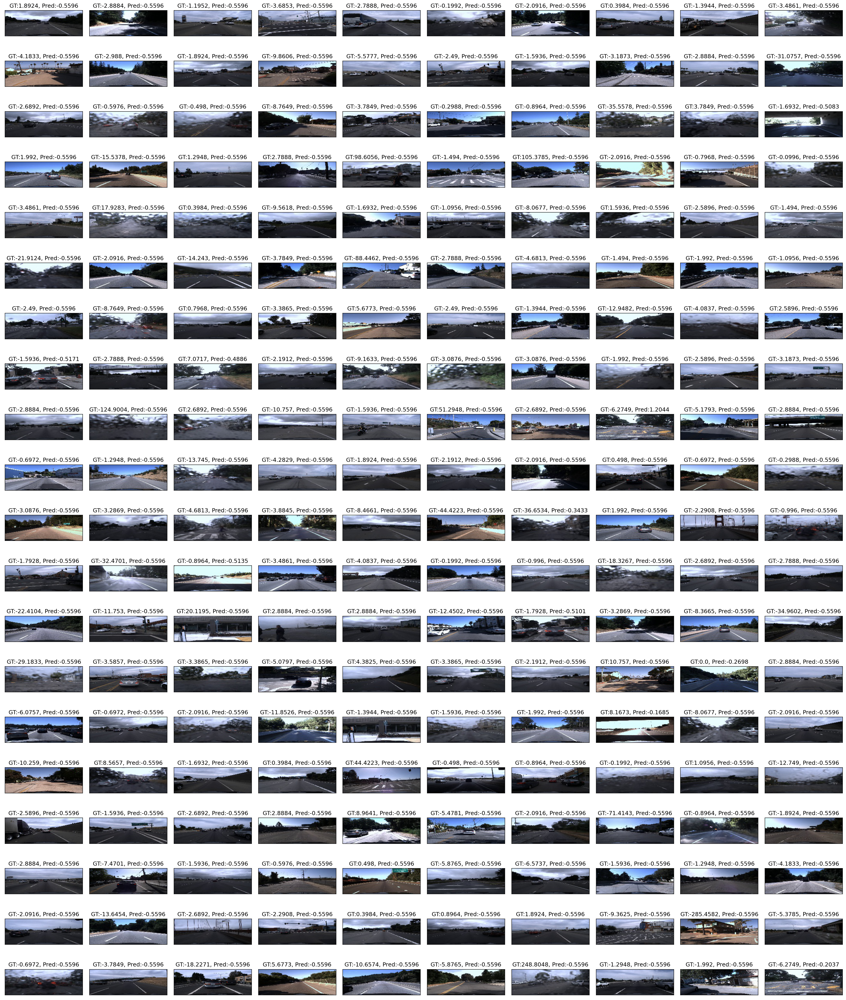

In [25]:
images = np.moveaxis(images, 1, -1)
print(images.shape)

plt_images=[]
for img in images:
    plt_images.append(Image.fromarray(np.uint8(img)).convert('RGB'))
    
fig, ax = plt.subplots(20,10, figsize=(25,30), dpi=150)
for i in range(20):
    for j in range(10):
        ind = i*10 + j
        ax[i][j].imshow(plt_images[ind]);
        ax[i][j].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
        ax[i][j].set_title("GT:{}, Pred:{}".format(round(targets[ind],4),round(outputs[ind],4)))
fig.tight_layout()
plt.show()

## Sequence of images

In [26]:
# How closely is it able to track in a sequence
# Values scaled in the real scale

permutation = 500 + np.arange(0,200,1)
images = val_images[permutation]
targets = 15.0*val_targets[permutation]

In [27]:
trained_model.eval()

predictions=[]
activations =[]

with torch.no_grad():
    for img in images:
        
        inpt = torch.tensor(img).unsqueeze(0)
        outputs = trained_model(inpt) # input should be [1, 3, 66, 200]
        predictions.append(outputs.data.item())

predictions = np.array(predictions)
print("Total Predicted", predictions.shape, np.max(predictions), np.min(predictions), np.mean(predictions))

outputs = 15.0*predictions

Total Predicted (200,) 0.09228852391242981 -0.037306930869817734 -0.03634926955215633


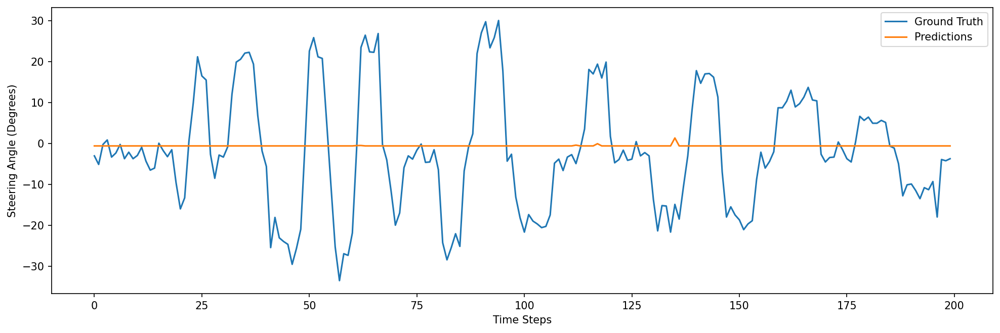

In [28]:
fig, ax = plt.subplots(figsize=(16,5), dpi =150)
ax.plot(targets) #gts
ax.plot(outputs) # preds
ax.set_ylabel("Steering Angle (Degrees)")
ax.set_xlabel("Time Steps")
ax.legend(["Ground Truth", "Predictions"])

## Activation maps of first or second conv  layer on a trained model
- Feature map vs activation maps
- Each image has 24 feature maps

In [ ]:
num = 10
act = activations[num].numpy().squeeze()
act.shape

In [ ]:
act_images=[]
for img in act:
    act_images.append(Image.fromarray(np.uint8(img)))
    
seq_images=[]
for img in images:
    seq_images.append(Image.fromarray(np.uint8(img)).convert('RGB'))
    
fig, ax = plt.subplots(12,4, figsize=(25,30), dpi=150)
for i in range(12):
    for j in range(4):
        placeholder = i*4 + j
        if placeholder%2==0:
            ind = int(placeholder/2)
            #print(ind)
            ax[i][j].set_title("Image")
            ax[i][j].imshow(seq_images[num]);
            ax[i][j].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
            
        else:
            ind = int(placeholder/2)
            #print(ind)
            ax[i][j].set_title("Feature Map {}".format(ind))
            ax[i][j].imshow(act_images[ind], cmap='gray');
            ax[i][j].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
            
fig.tight_layout()
plt.show()

## Thresholding to get classification like accuracy value (for all predictions)

In [ ]:
error = targets - outputs 
error_per = np.array([round(100*np.abs(error[i]/targets[i]),2) for i in range(error.shape[0])])
df = pd.DataFrame(np.array([targets, outputs, error,error_per]).T, columns=["Ground Truth (GT)", "Predictions", "Error", "Error % of GT"])
df.head(60)

In [ ]:
print("Mean Error percentage ={} %, Std of Error percentage= {} %".format(round(np.mean(error_per),2), round(np.std(error_per),2)))

In [ ]:
fig, ax = plt.subplots(figsize=(5,5), dpi=100)
ax.set_xlim([-5,100])
ax.hist(error_per, density=False, bins=1000);
ax.set_xticks(np.arange(-5,100,5));

In [ ]:
# look at the sample where error as high and low